In [ ]:
# Import all libraries
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale
from sklearn.metrics import RocCurveDisplay, auc, roc_curve

In [3]:
floatX = pytensor.config.floatX
RANDOM_SEED = 9927
rng = np.random.default_rng(RANDOM_SEED)


In [4]:
# Import dataset
df = pd.read_csv("banana_quality.csv")
df['Quality'] = df['Quality'].replace({'Good':1,'Bad':0})
df.head()

C:\Users\User\AppData\Local\Temp\ipykernel_5300\2968013229.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Quality'] = df['Quality'].replace({'Good':1,'Bad':0})


,Size,Weight,Sweetness,Softness,HarvestTime,Ripeness,Acidity,Quality
0,-1.924968,0.468078,3.077832,-1.472177,0.294799,2.435570,0.271290,1
1,-2.409751,0.486870,0.346921,-2.495099,-0.892213,2.067549,0.307325,1
2,-0.357607,1.483176,1.568452,-2.645145,-0.647267,3.090643,1.427322,1
3,-0.868524,1.566201,1.889605,-1.273761,-1.006278,1.873001,0.477862,1
4,0.651825,1.319199,-0.022459,-1.209709,-1.430692,1.078345,2.812442,1


c:\Users\User\miniconda3\envs\pymc_env\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


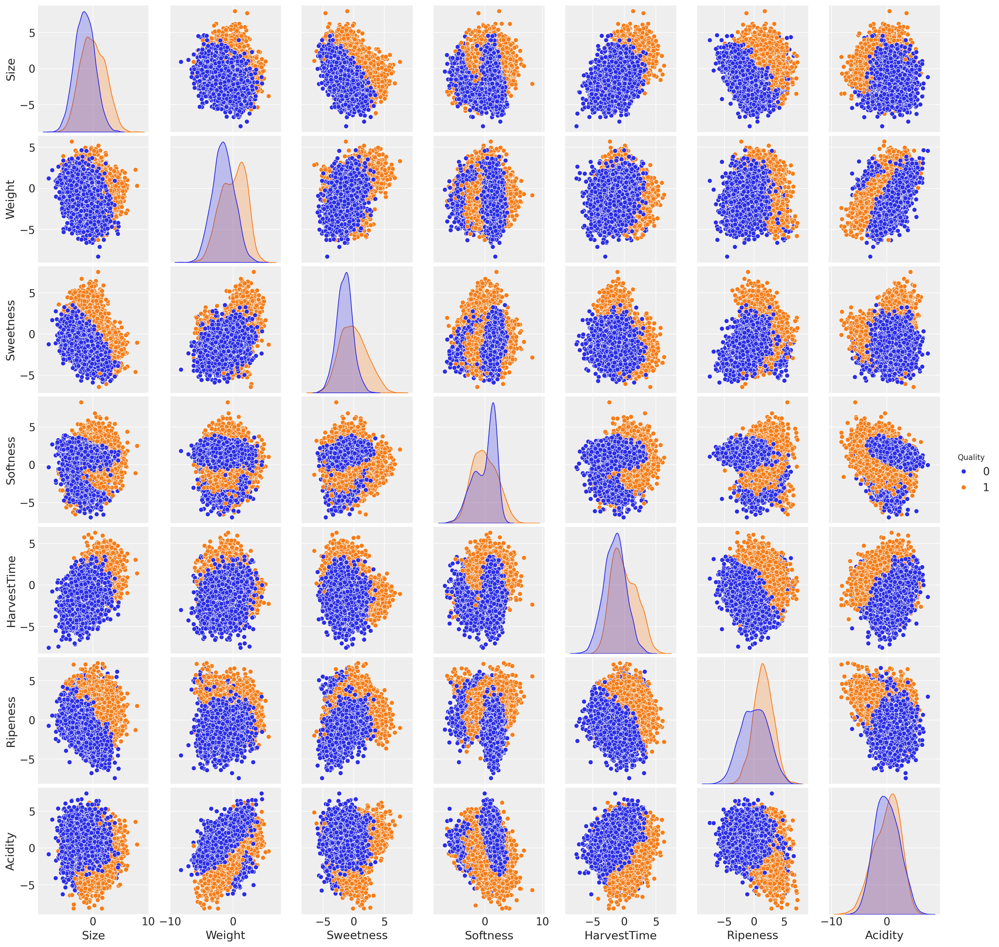

In [40]:
sns.pairplot(df, hue='Quality')
plt.savefig("./SPLOM.svg")

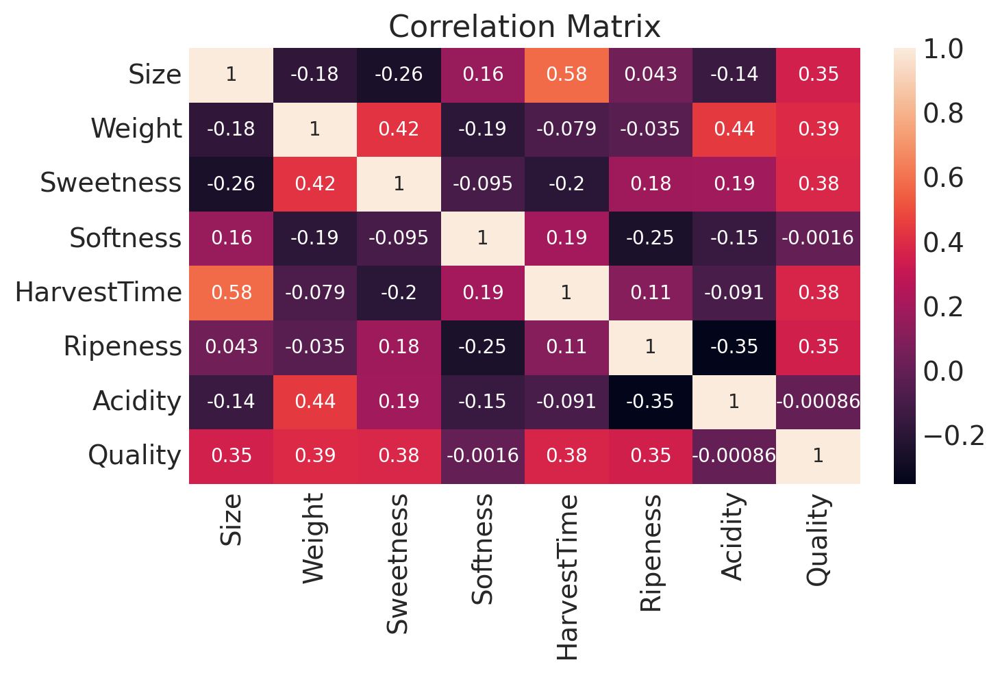

In [41]:
corr_mat=df.corr()
sns.heatmap(corr_mat,annot=True).set_title("Correlation Matrix")
plt.savefig("./result/correlation_matrix.svg")

In [6]:
X, Y = df.drop("Quality", axis=1).values, df[["Quality"]].values.reshape(-1, )
X = scale(X)
X = X.astype(floatX)
Y = Y.astype(floatX)
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.5)

In [7]:
X_train.shape, Y_train.shape

((4000, 7), (4000,))

In [8]:
def construct_nn(ann_input, ann_output):
    n_hidden = 5

    # Initialize random weights between each layer
    init_1 = rng.standard_normal(size=(X_train.shape[1], n_hidden)).astype(floatX)
    init_2 = rng.standard_normal(size=(n_hidden, n_hidden)).astype(floatX)
    init_out = rng.standard_normal(size=n_hidden).astype(floatX)

    coords = {
        "hidden_layer_1": np.arange(n_hidden),
        "hidden_layer_2": np.arange(n_hidden),
        "train_cols": np.arange(X_train.shape[1]),
        # "obs_id": np.arange(X_train.shape[0]),
    }
    with pm.Model(coords=coords) as neural_network:
        ann_input = pm.Data("ann_input", X_train, mutable=True, dims=("obs_id", "train_cols"))
        ann_output = pm.Data("ann_output", Y_train, mutable=True, dims="obs_id")

        # Weights from input to hidden layer
        weights_in_1 = pm.Normal(
            "w_in_1", 0, sigma=1, initval=init_1, dims=("train_cols", "hidden_layer_1")
        )

        # Weights from 1st to 2nd layer
        weights_1_2 = pm.Normal(
            "w_1_2", 0, sigma=1, initval=init_2, dims=("hidden_layer_1", "hidden_layer_2")
        )

        # Weights from hidden layer to output
        weights_2_out = pm.Normal("w_2_out", 0, sigma=1, initval=init_out, dims="hidden_layer_2")

        # Build neural-network using tanh activation function
        act_1 = pm.math.tanh(pm.math.dot(ann_input, weights_in_1))
        act_2 = pm.math.tanh(pm.math.dot(act_1, weights_1_2))
        act_out = pm.math.sigmoid(pm.math.dot(act_2, weights_2_out))
        #out  = pm.Categorical("out", p=act_out, observed=ann_output, total_size=Y_train.shape[0], dims="obs_id")

        # out =  pm.Categorical("out", n=1, p=act_out, observed=ann_output, total_size=Y_train.shape[0], dims="obs_id")

        #Binary classification -> Bernoulli likelihood
        out = pm.Bernoulli(
            "out",
            act_out,
            observed=ann_output,
            total_size=Y_train.shape[0],  # IMPORTANT for minibatches
            dims="obs_id",
        )
    return neural_network

minibatch_x = pm.Minibatch(X_train, batch_size=50)
minibatch_y = pm.Minibatch(Y_train, batch_size=50)
neural_network_minibatch = construct_nn(minibatch_x, minibatch_y)
#neural_network = construct_nn(X_train, Y_train)

In [9]:
%%time

with neural_network_minibatch:
    idata = pm.sample(100)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [w_in_1, w_1_2, w_2_out]


Sampling 4 chains for 1_000 tune and 100 draw iterations (4_000 + 400 draws total) took 6559 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


CPU times: total: 1 s
Wall time: 1h 49min 22s


In [30]:
az.summary(idata, var_names="w_in_1").to_csv("MCMC_result_summary.csv")

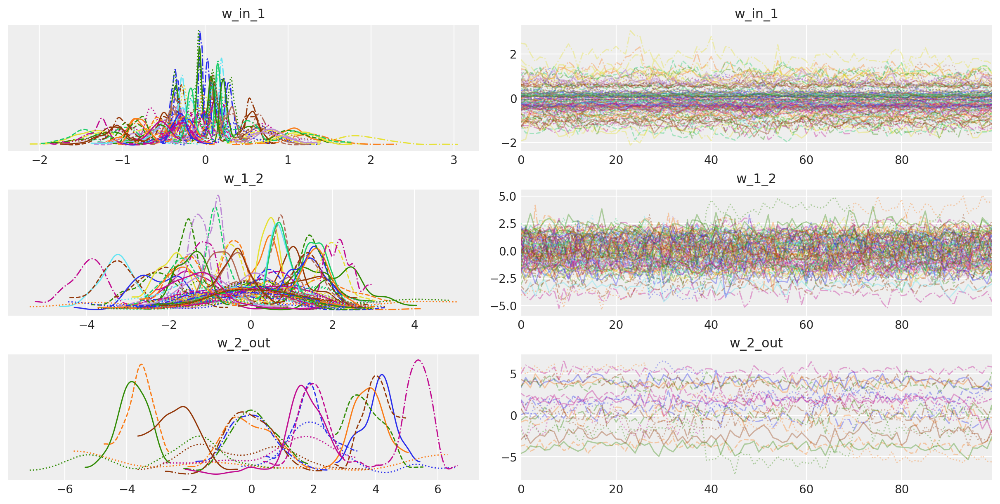

In [42]:
axes = az.plot_trace(idata)
fig = axes.ravel()[0].figure
fig.savefig("./result/mcmc_plot_trace.svg")

In [31]:
with neural_network_minibatch: 
    pm.set_data(new_data={"ann_input": X_test})
    idata.extend(pm.sample_posterior_predictive(idata))

Sampling: [out]


In [32]:
p_test_pred = idata.posterior_predictive["out"].mean(dim=["chain", "draw"])
y_test_pred = (p_test_pred >= 0.5).astype("int").to_numpy() 

In [35]:
print(f"accuracy = {np.mean(Y_test==y_test_pred) * 100: 0.3f}")

accuracy =  95.475


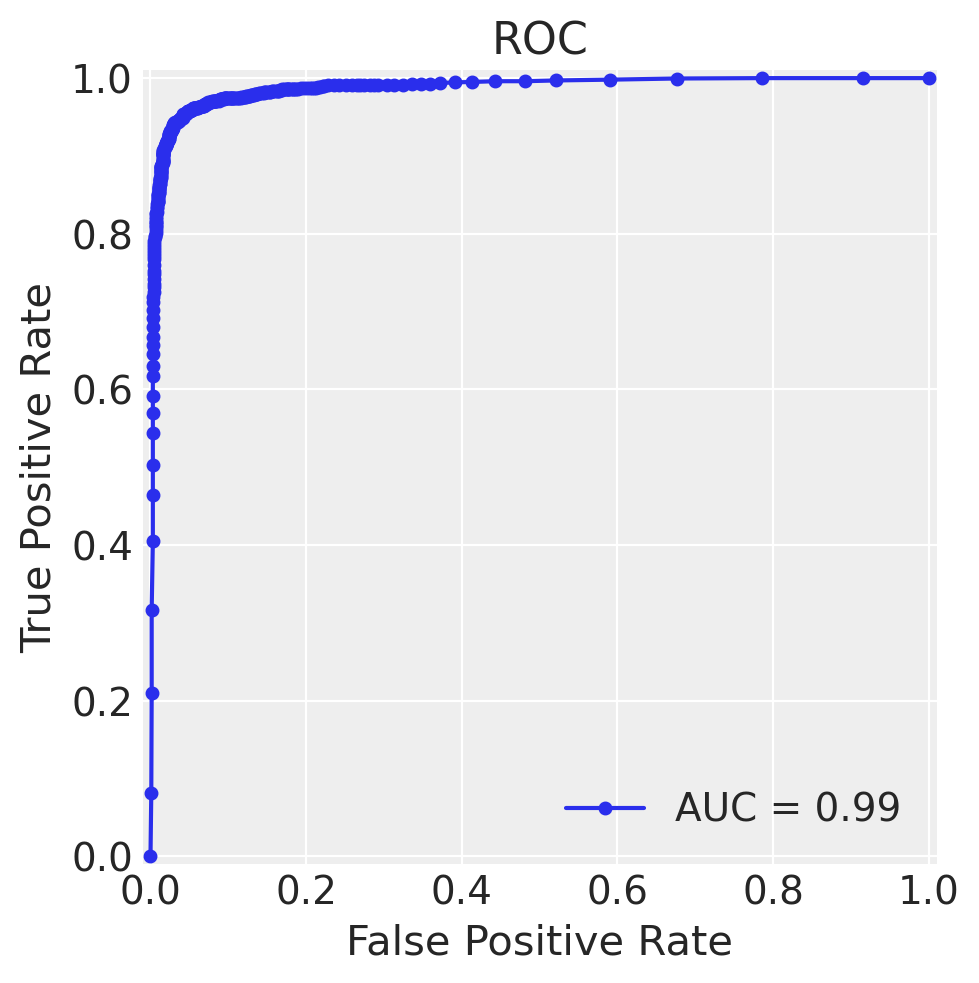

In [38]:
fpr, tpr, thresholds = roc_curve(
    y_true=Y_test, y_score=p_test_pred, pos_label=1, drop_intermediate=False
)
roc_auc = auc(fpr, tpr)

fig, ax = plt.subplots()
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
roc_display = roc_display.plot(ax=ax, marker="o", markersize=4)
ax.set(title="ROC")
plt.savefig("./result/mcmc_ROC.svg")